In [6]:
from pylab import *
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyfits
from matplotlib.ticker import (AutoLocator, AutoMinorLocator)

from matplotlib.ticker import NullFormatter  # useful for `logit` scale
from astropy.time import Time

from astropy.stats import LombScargle
plt.style.use('seaborn-whitegrid')

%matplotlib inline
%config InlineBackend.figure_format='svg'
#%config InlineBackend.figure_format='retina'

In [17]:
ls /Users/brettlv/Downloads/wise_cl/*_neo.csv > /Users/brettlv/Downloads/wise_cl/neo_list.txt


In [1]:
cat /Users/brettlv/Downloads/wise_cl/neo_list.txt

/Users/brettlv/Downloads/wise_cl/HE1136-2304_neo.csv
/Users/brettlv/Downloads/wise_cl/IC751_neo.csv
/Users/brettlv/Downloads/wise_cl/Mrk1018_neo.csv
/Users/brettlv/Downloads/wise_cl/Mrk1210_neo.csv
/Users/brettlv/Downloads/wise_cl/Mrk273_neo.csv
/Users/brettlv/Downloads/wise_cl/Mrk530_neo.csv
/Users/brettlv/Downloads/wise_cl/Mrk590_neo.csv
/Users/brettlv/Downloads/wise_cl/NGC1365_neo.csv
/Users/brettlv/Downloads/wise_cl/NGC1566_neo.csv
/Users/brettlv/Downloads/wise_cl/NGC2992_neo.csv
/Users/brettlv/Downloads/wise_cl/NGC3516_neo.csv
/Users/brettlv/Downloads/wise_cl/NGC4151_neo.csv
/Users/brettlv/Downloads/wise_cl/NGC7319_neo.csv
/Users/brettlv/Downloads/wise_cl/NGC7582_neo.csv


In [18]:
ls /Users/brettlv/Downloads/wise_cl/*_multi_epoch.csv > /Users/brettlv/Downloads/wise_cl/multi_epoch_list.txt

In [3]:
ls /Users/brettlv/Downloads/wise_cl/lv_clagn/*_neo.csv > /Users/brettlv/Downloads/wise_cl/lv_clagn/neo_list.txt

In [2]:
ls /Users/brettlv/Downloads/wise_cl/lv_clagn/*_multi_epoch.csv > /Users/brettlv/Downloads/wise_cl/lv_clagn/multi_epoch_list.txt

In [19]:
neo_lists=[]
with open ('/Users/brettlv/Downloads/wise_cl/neo_list.txt','r') as f:
    neo_list=f.readlines()
    for line in neo_list:
        neo_lists.append(line.rstrip('\n'))   
        
multi_epoch_lists=[]
with open ('/Users/brettlv/Downloads/wise_cl/multi_epoch_list.txt','r') as f:
    multi_epoch_list=f.readlines()
    for line in multi_epoch_list:
        multi_epoch_lists.append(line.rstrip('\n'))         
        

In [20]:
len(neo_lists),len(multi_epoch_lists)

(14, 14)

In [ ]:
UGC 4203(Mrk 1210) Phoenix Galaxy

/Users/brettlv/Downloads/wise_cl/HE1136-2304_neo.csv /Users/brettlv/Downloads/wise_cl/HE1136-2304_multi_epoch.csv
0 HE1136-2304
HE1136-2304
mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise
/Users/brettlv/Downloads/wise_cl/IC751_neo.csv /Users/brettlv/Downloads/wise_cl/IC751_multi_epoch.csv
1 IC751
IC751
mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise
/Users/brettlv/Downloads/wise_cl/Mrk1018_neo.csv /Users/brettlv/Downloads/wise_cl/Mrk1018_multi_epoch.csv
2 Mrk1018
Mrk1018
mjd w1mpro_ep w1sigmpro_

/Users/brettlv/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1494: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)



/Users/brettlv/Downloads/wise_cl/NGC1365_neo.csv /Users/brettlv/Downloads/wise_cl/NGC1365_multi_epoch.csv
7 NGC1365
NGC1365
mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise
/Users/brettlv/Downloads/wise_cl/NGC1566_neo.csv /Users/brettlv/Downloads/wise_cl/NGC1566_multi_epoch.csv
8 NGC1566
NGC1566
mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise
/Users/brettlv/Downloads/wise_cl/NGC2992_neo.csv /Users/brettlv/Downloads/wise_cl/NGC2992_multi_epoch.csv
9 NGC2992
NGC2992
mjd w1mpro_ep w1sigmpro_ep
mjd 

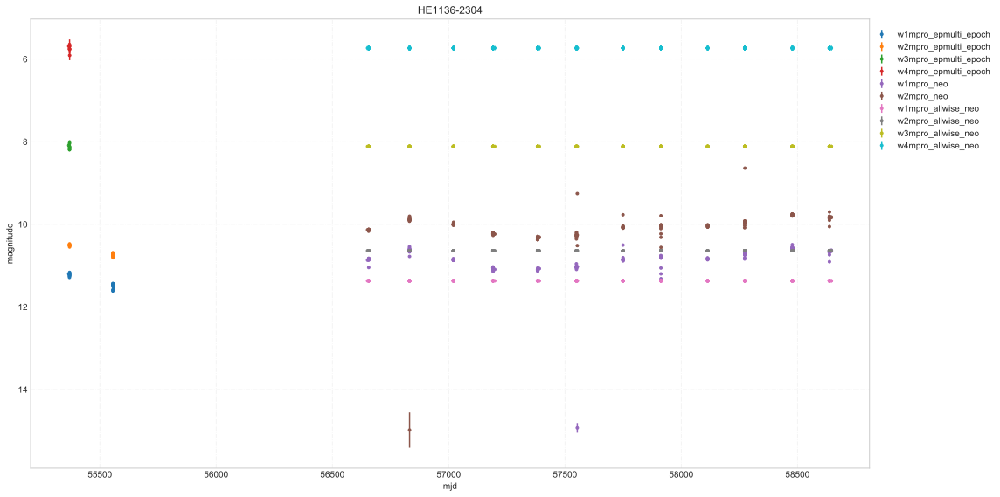

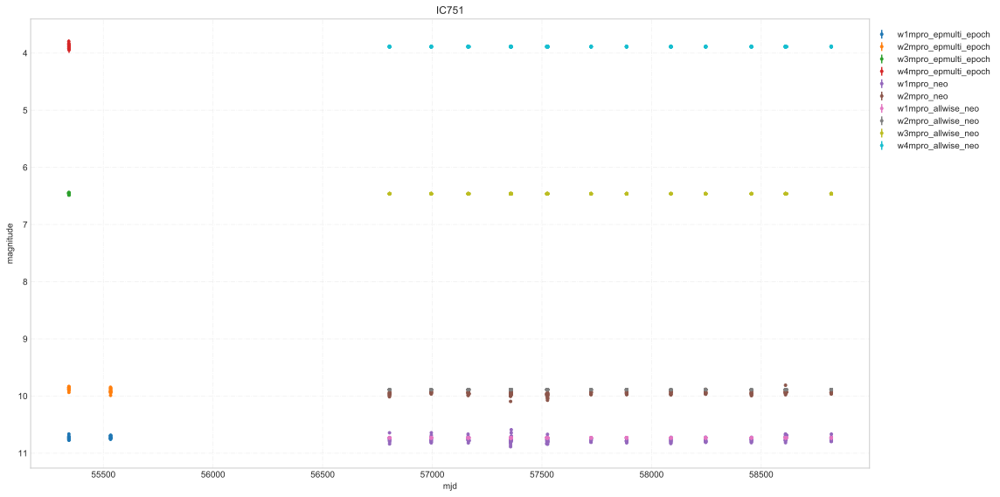

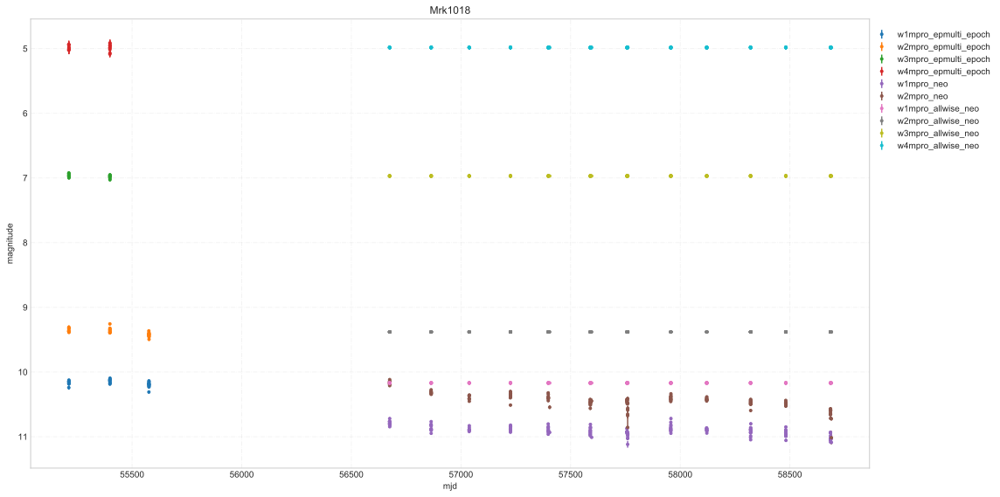

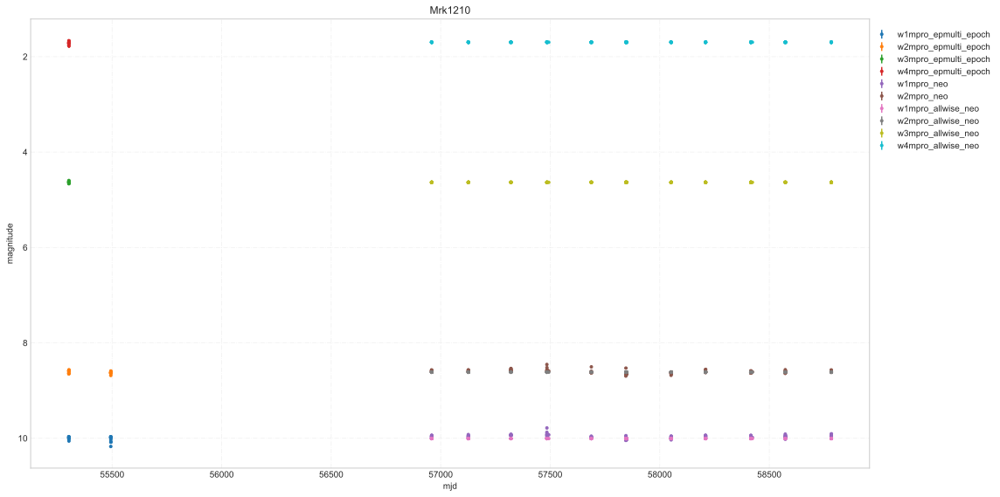

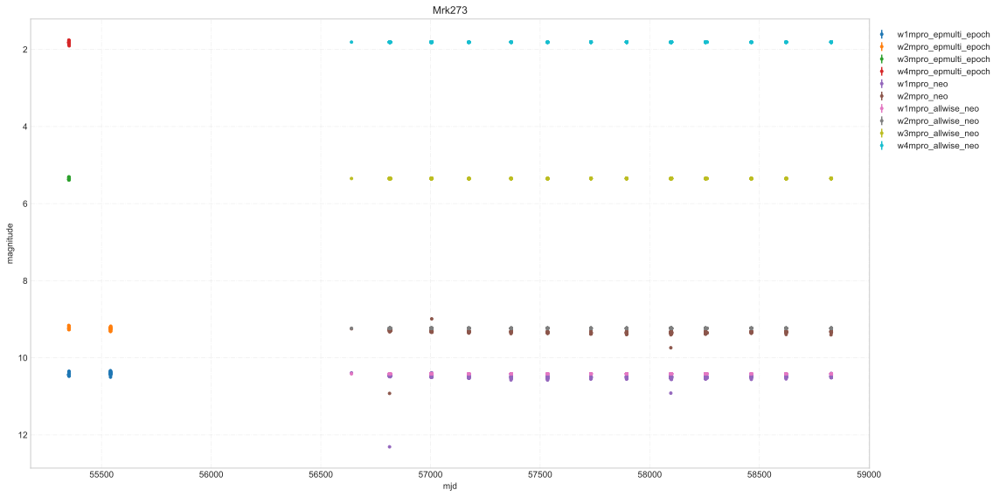

...

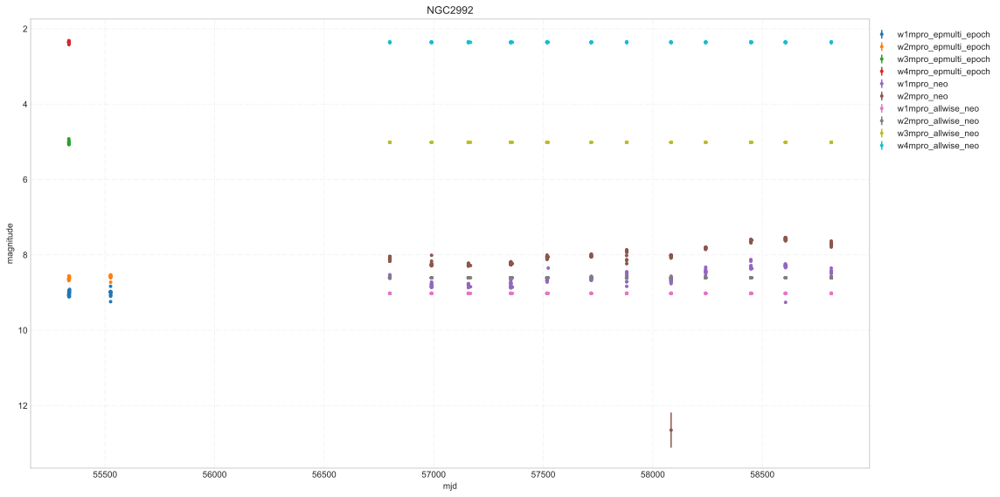

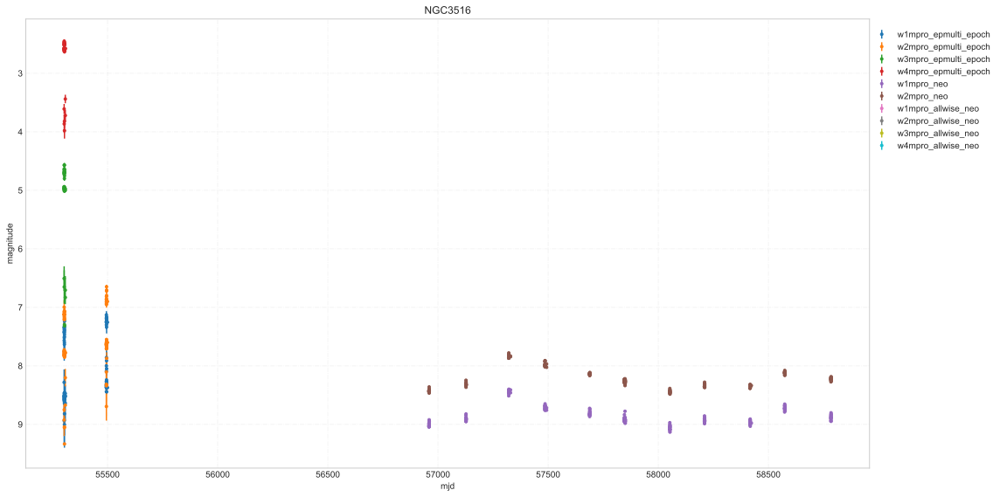

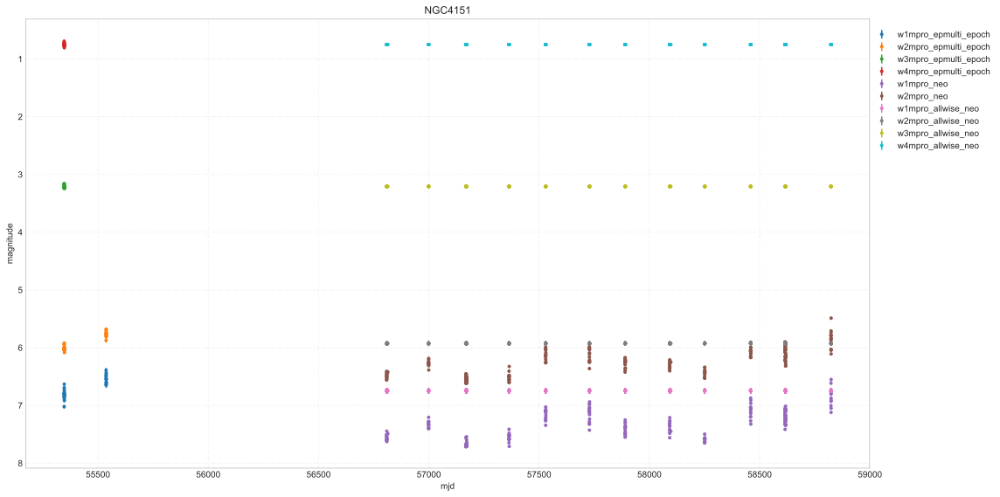

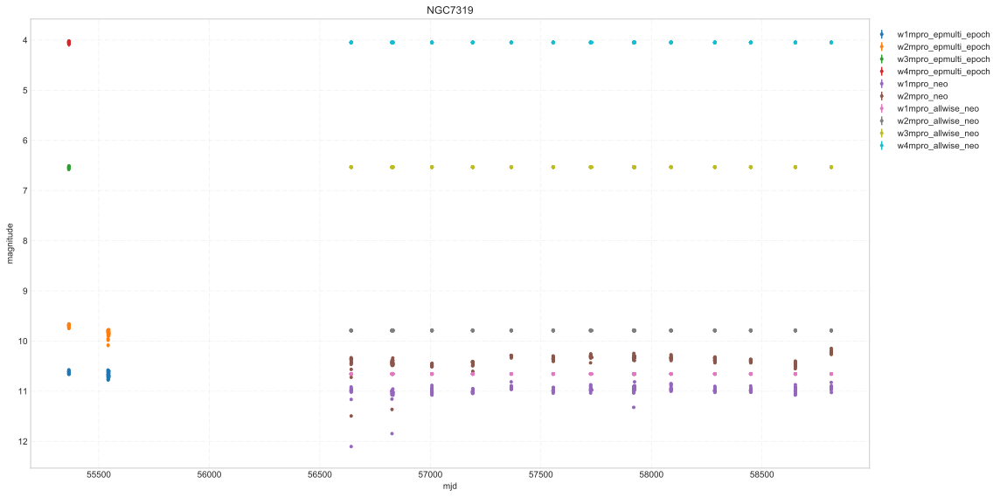

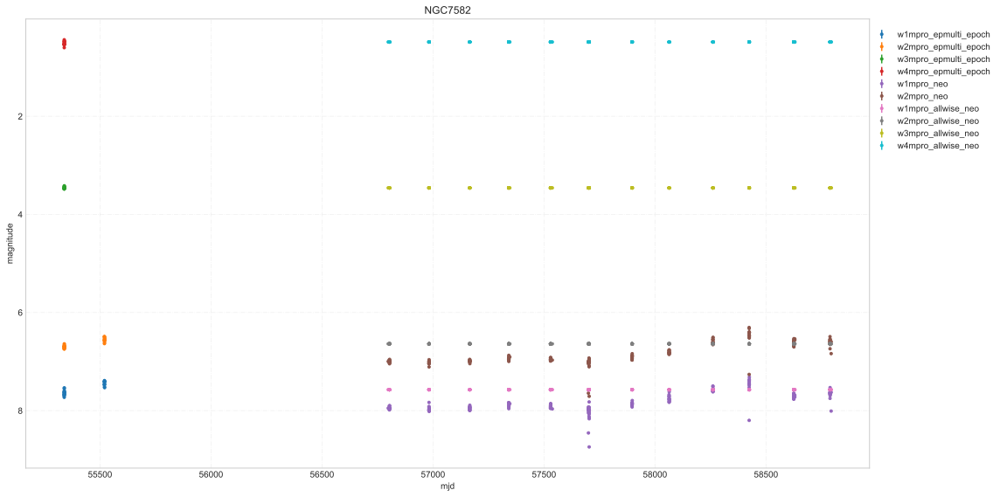

In [27]:
for i,(n_,m_) in enumerate(zip(neo_lists,multi_epoch_lists)):
    print(n_,m_)
    name=n_.split('/')[-1].split('_')[0]
    print(i,name) 
    plot_wise(n_,m_)


In [ ]:
w1mpro	Mag. 3.4µm	Magnitude at 3.4µm measured with profile-fitting photometry, or the magnitude of the 95% confidence brightness upper limit if the 3.4µm flux measurement has SNR<2. This column is null if the source is nominally detected in 3.4µm, but no useful brightness estimate could be made.	mag	phot.mag;em.IR.3-4um
w2mpro	Mag. 4.6µm	Magnitude at 4.6µm measured with profile-fitting photometry, or the magnitude of the 95% confidence brightness upper limit if the 4.6µm flux measurement has SNR<2. This column is null if the source is nominally detected in 4.6µm, but no useful brightness estimate could be made.	mag	phot.mag;em.IR.4-8um
w3mpro	Mag. 12µm	Magnitude at 12µm measured with profile-fitting photometry, or the magnitude of the 95% confidence brightness upper limit if the 12µm flux measurement has SNR<2. This column is null if the source is nominally detected in 12µm, but no useful brightness estimate could be made.	mag	phot.mag;em.IR.8-15um
w4mpro	Mag. 22µm	Magnitude at 22µm measured with profile-fitting photometry, or the magnitude of the 95% confidence brightness upper limit if the 22µm flux measurement has SNR<2. This column is null if the source is nominally detected in 22µm, but no useful brightness estimate could be made.	mag	phot.mag;em.IR.15-30um

In [ ]:
Mrk1018，Mrk530,Mrk590,NGC1365,NGC1566,NGC2992,NGC3516,NGC4151

NGC7319,NGC7582



NGC1566，NGC3516，NGC4151

In [11]:
def plot_wise(n_,m_):   
    data_allwise_epoch=pd.read_csv(m_)
    data_neowise=pd.read_csv(n_)
    fig, axs = plt.subplots(1, 1,figsize=(16,8))
    name=n_.split('/')[-1].split('_')[0]
    print(name)
    axs.set_title(name)

    for i in range(4):
        name_mjd='mjd'
        name_band=data_allwise_epoch.columns[i*3+8]
        name_err=data_allwise_epoch.columns[i*3+9]
        print(name_mjd,name_band,name_err)
        data_band=data_allwise_epoch[data_allwise_epoch[name_mjd].notnull()]  
        axs.errorbar(data_band[name_mjd],data_band[name_band],data_band[name_err],fmt='.',label=name_band+'multi_epoch')
        

    data_neowise_select=data_neowise.loc[:, ['w1mpro', 'w1sigmpro',
         'w2mpro', 'w2sigmpro','w1mpro_allwise', 'w1sigmpro_allwise', 'w2mpro_allwise',
        'w2sigmpro_allwise', 'w3mpro_allwise', 'w3sigmpro_allwise',
        'w4mpro_allwise', 'w4sigmpro_allwise','mjd']]

    for i in range(6):
        name_mjd='mjd'
        name_band=data_neowise_select.columns[i*2]
        name_err=data_neowise_select.columns[i*2+1]
        print(name_mjd,name_band,name_err)        
        data_new=data_neowise_select[data_neowise_select[name_mjd].notnull()]
        data_new=data_new[data_new[name_band].notnull()]
        axs.errorbar(data_new[name_mjd],data_new[name_band],data_new[name_err],fmt='.',label=name_band+'_neo')
        
    axs.set_ylabel('magnitude')      
    axs.legend(loc=[1.0,0.7])
    axs.invert_yaxis()
    axs.xaxis.set_minor_locator(AutoMinorLocator())
    axs.grid(which='major',ls='-.',alpha=0.3)
    axs.set_ylabel('magnitude')
    axs.set_xlabel('mjd')
    plt.tight_layout()
    plt.savefig('/Users/brettlv/Downloads/wise_cl/%s.png'%name,dpi=400)





In [ ]:
MJD = JD - 2400000.5

In [4]:
neo_lists_lv=[]
with open ('/Users/brettlv/Downloads/wise_cl/lv_clagn/neo_list.txt','r') as f:
    neo_list=f.readlines()
    for line in neo_list:
        neo_lists_lv.append(line.rstrip('\n'))   
        
multi_epoch_lists_lv=[]
with open ('/Users/brettlv/Downloads/wise_cl/lv_clagn/multi_epoch_list.txt','r') as f:
    multi_epoch_list=f.readlines()
    for line in multi_epoch_list:
        multi_epoch_lists_lv.append(line.rstrip('\n'))    

In [9]:
neo_lists_lv

['/Users/brettlv/Downloads/wise_cl/lv_clagn/3C390.3_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/ESO362-G18_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/Fairall9_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC1097_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC2617_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC3227_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC4593_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC5548_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC7603_neo.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/ZTF18aajupnt_neo.csv']

In [10]:
multi_epoch_lists_lv

['/Users/brettlv/Downloads/wise_cl/lv_clagn/3C390.3_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/ESO362-G18_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/Fairall9_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC1097_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC2617_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC3227_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC4593_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC5548_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/NGC7603_multi_epoch.csv',
 '/Users/brettlv/Downloads/wise_cl/lv_clagn/ZTF18aajupnt_multi_epoch.csv']

/Users/brettlv/Downloads/wise_cl/lv_clagn/3C390.3_neo.csv /Users/brettlv/Downloads/wise_cl/lv_clagn/3C390.3_multi_epoch.csv
0 3C390.3
3C390.3
mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise
/Users/brettlv/Downloads/wise_cl/lv_clagn/ESO362-G18_neo.csv /Users/brettlv/Downloads/wise_cl/lv_clagn/ESO362-G18_multi_epoch.csv
1 ESO362-G18
ESO362-G18
mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise
/Users/brettlv/Downloads/wise_cl/lv_clagn/Fairall9_neo.csv /Users/brettlv/Downloads/wise_cl/lv_clagn/Fairall

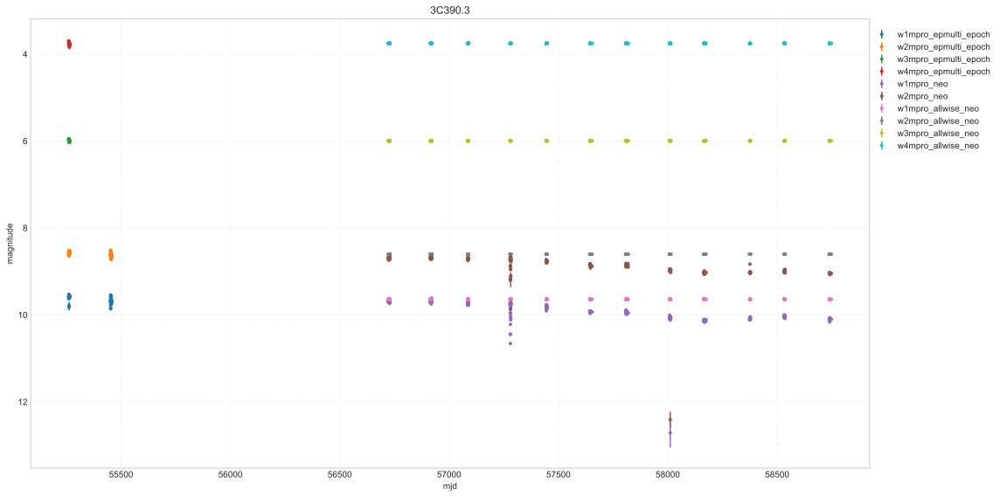

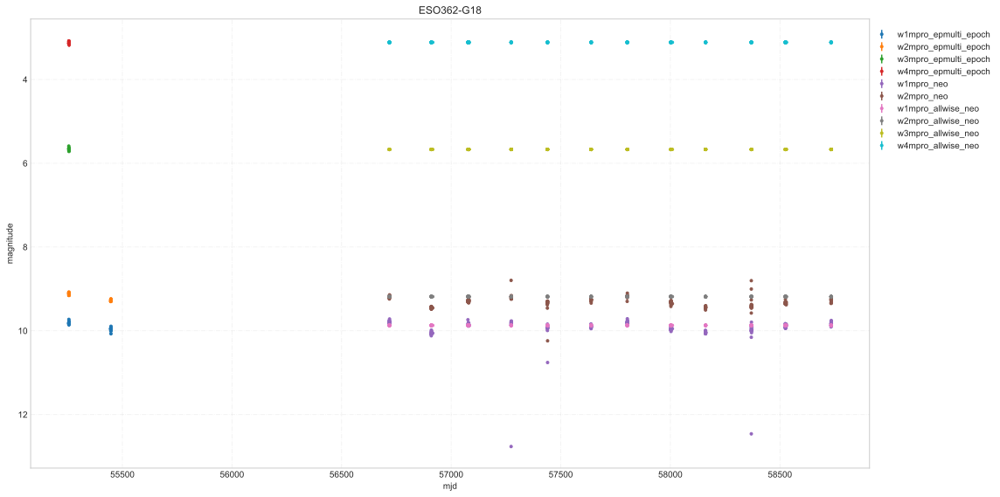

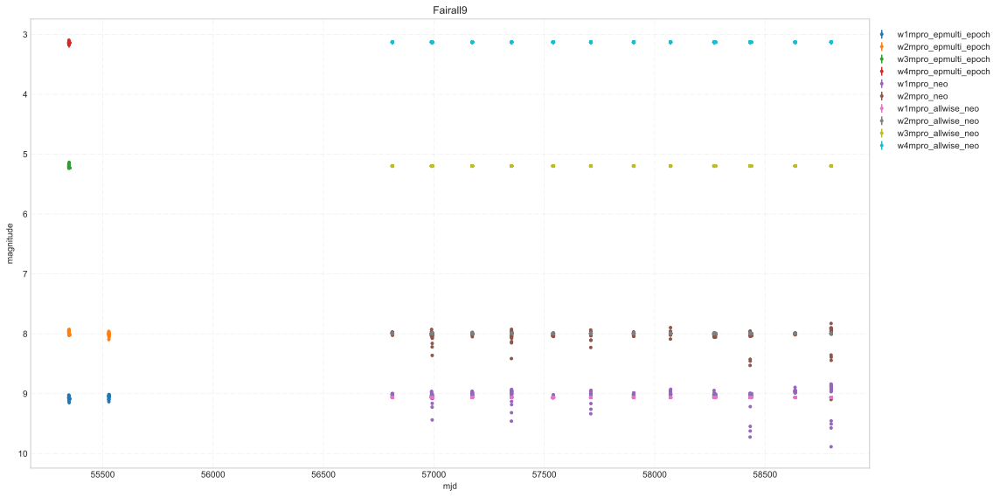

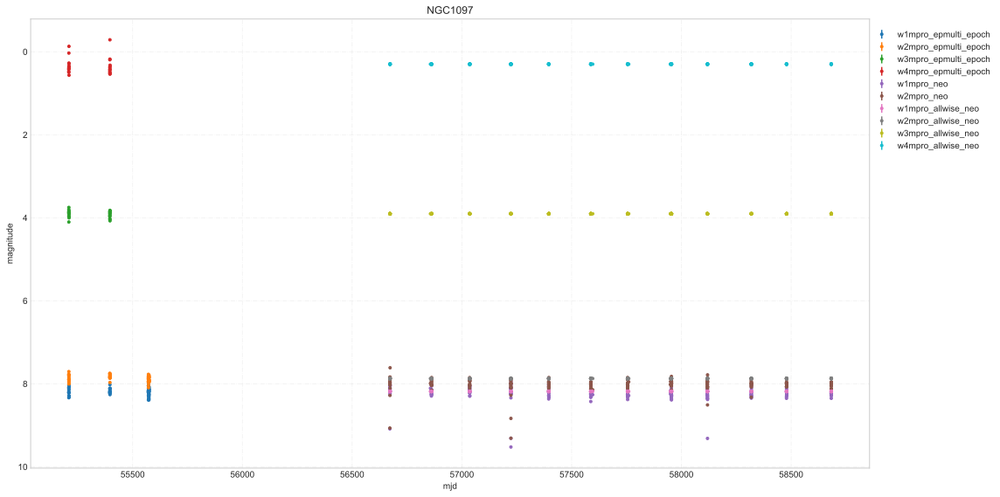

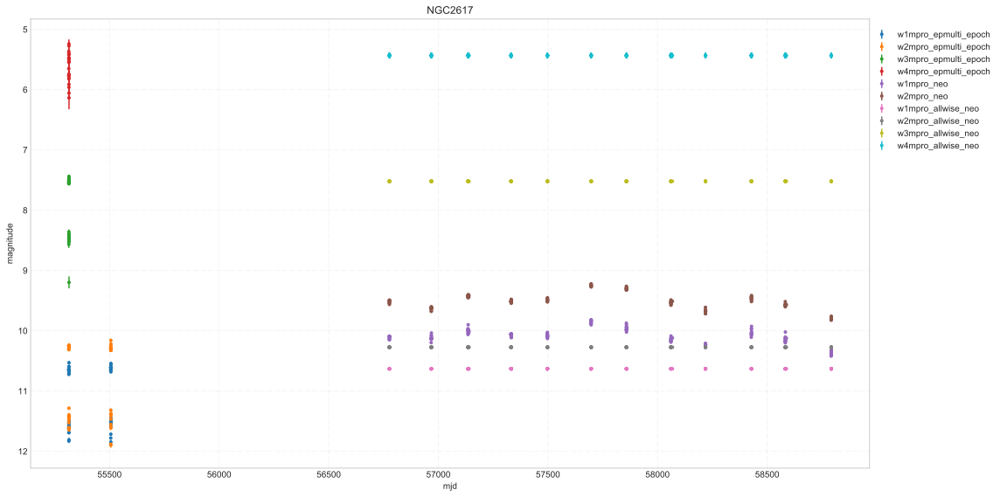

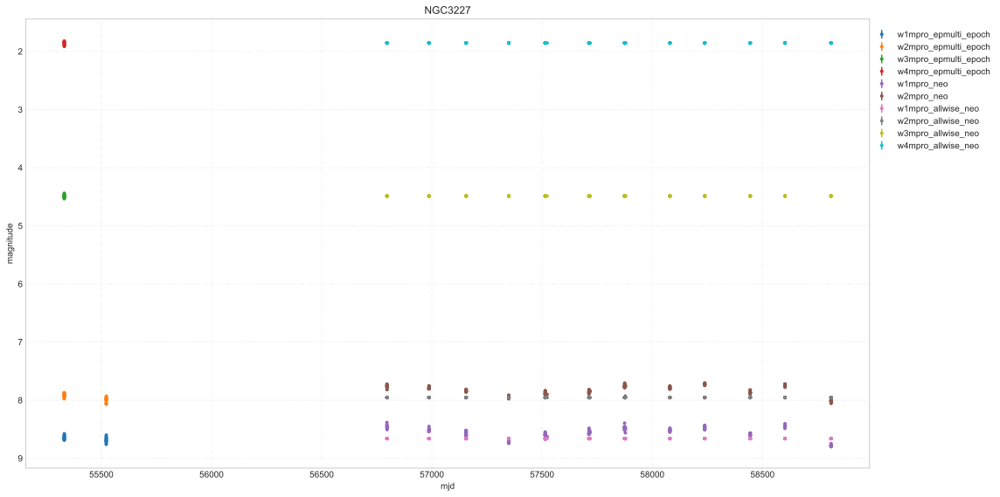

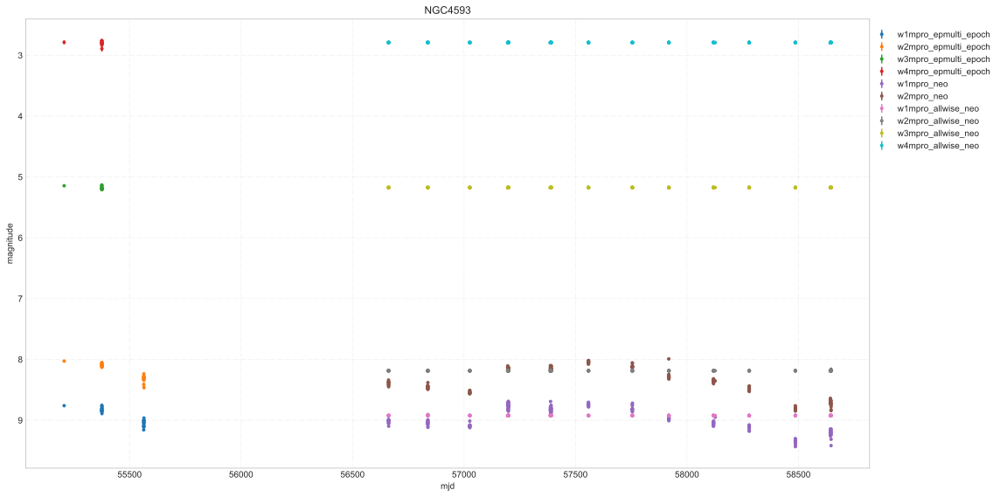

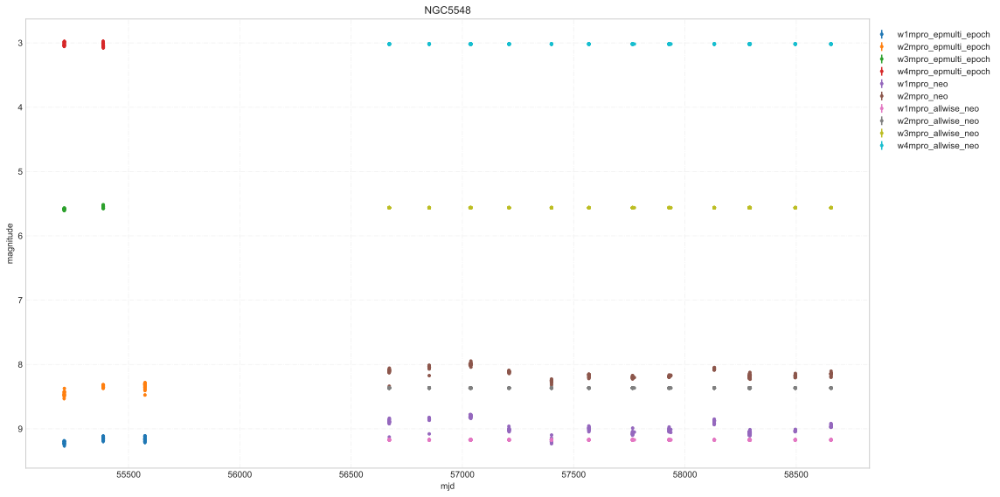

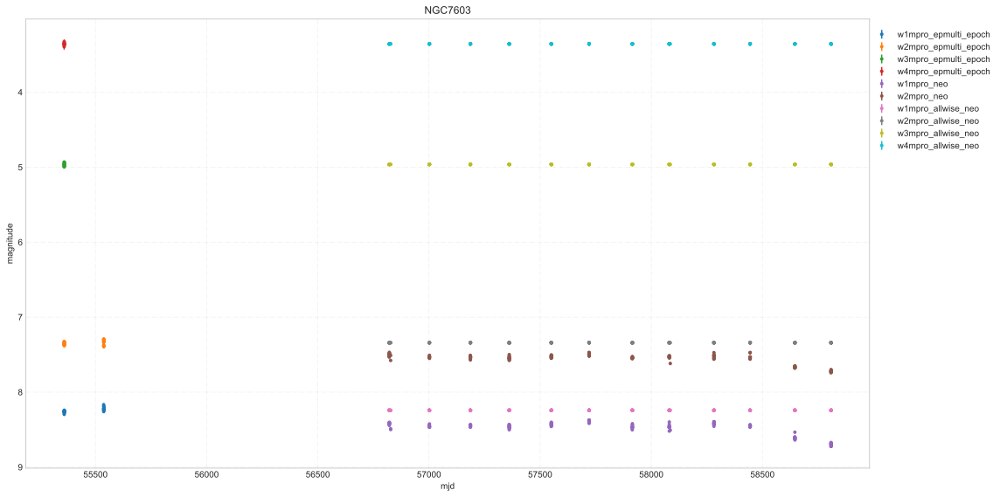

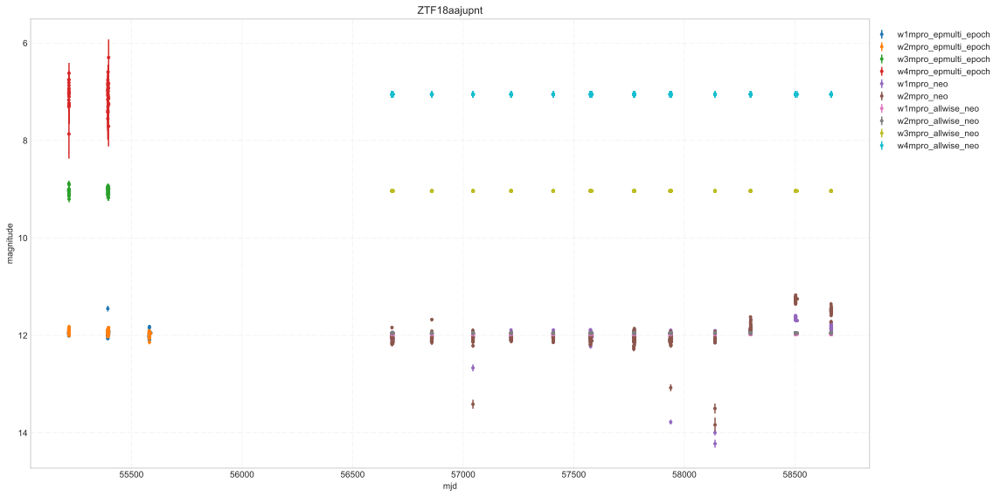

In [12]:
for i,(n_,m_) in enumerate(zip(neo_lists_lv,multi_epoch_lists_lv)):
    print(n_,m_)
    name=n_.split('/')[-1].split('_')[0]
    print(i,name) 
    plot_wise(n_,m_)